# Practical 1 - Signal Representations and Noisy Mixtures

[Nasser-eddine Monir](https://nasseredd.github.io/teaching/) (CC BY-NC-SA) -- 2024

* 👥 You may work in pairs,
* 📩 however, submit your work individually by the end of the class.
* 📩 (Optional) Second submission due by Friday, December 27th, 2024, at 11:59 PM.
* 📝 Your names should be included in the file names as follows: **Practical-1-Monir.ipynb**.
* 📧 Please ensure you email me EXCLUSIVELY at the following address: nasser-eddine.monir@inria.fr

# Imports

In [1]:
! pip install sounddevice --quiet

In [2]:
import os
import pandas as pd
import librosa
import numpy as np
import seaborn as sns
import soundfile as sf
import librosa.display
import matplotlib.pyplot as plt

# Audio Representations

* Download the `test-clean.tar.gz` from [Librispeech](https://www.openslr.org/12) and save it in `data/`.

**Loading an Audio**

* Load the audio `LibriSpeech/test-clean/61/70968/61-70968-0000.flac` using `librosa` in `speech` variable.
* Print the shape of the signal and the sample rate.

In [3]:
# TODO: code me

speech, sr = librosa.load("data/test-clean/61/70968/61-70968-0000.flac")

# Print the shape
print(speech.shape)
print(sr)

(108156,)
22050


**Display the Audio**

In [4]:
from IPython.display import Audio
Audio(speech, rate=sr)

**Waveform**

* Compute the duration of the speech signal by dividing its total number of samples by the sampling rate.
* Generate a time axis for the waveform using `np.linspace()` to create evenly spaced time points over the duration of the signal.

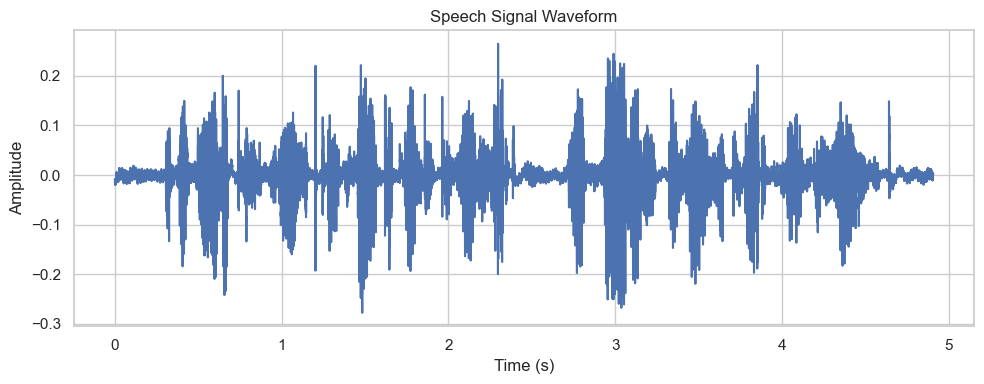

In [5]:
# Define the duration
# TODO: code me
duration = len(speech) / sr

# Create a time axis for the waveform
# TODO: code me
time_axis = np.linspace(0, duration, len(speech))

# Plot the waveform using seaborn
sns.set(style="whitegrid")
plt.figure(figsize=(10, 4))
sns.lineplot(x=time_axis, y=speech)
plt.title("Speech Signal Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()

**Spectrum**
* Define a function `compute_spectrum` that takes a signal.
* Compute the FFT of the signal using `np.fft.fft()`.
* Generate the frequency values using `np.fft.fftfreq()`.
* Identify indices corresponding to positive frequencies using `frequencies > 0`.
* Extract positive frequencies using the indices.
* Compute the magnitudes of the positive FFT results using `np.abs()`.
* Return the positive frequencies and magnitudes as outputs.

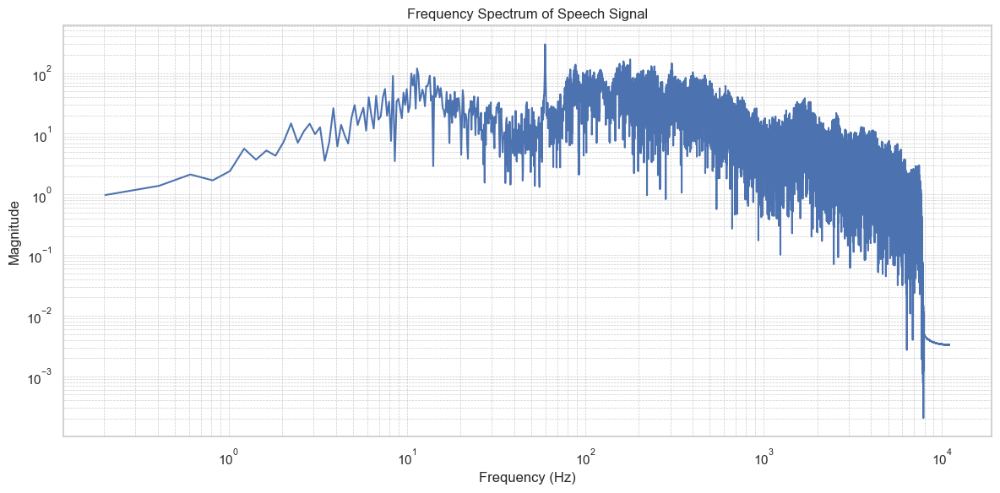

In [6]:
def compute_spectrum(speech):
    """
    Compute the spectrum of an audio file.
    """
    # Compute the Spectrum (Fourier Transform)
    # TODO: code me
    spectrum = np.fft.fft(speech)

    # Only keep the positive frequencies (single-sided spectrum)
    # TODO: code me

    frequency = np.fft.fftfreq(speech.size,  d=1/sr)
    positive_frequencies = frequency[frequency > 0]
    positive_magnitudes = np.abs(spectrum[frequency > 0])

    return positive_frequencies, positive_magnitudes

# Compute Spectrum
positive_frequencies, positive_magnitudes = compute_spectrum(speech)

# Plot the Spectrum on a Logarithmic Scale
plt.figure(figsize=(12, 6))
plt.loglog(positive_frequencies, positive_magnitudes)
plt.title('Frequency Spectrum of Speech Signal')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

**Spectrogram**

* Define a function `compute_stft_magnitude` with parameters signal, n_fft (1024), hop_length (=n_fft // 4 for 75% overlap), and window (default 'hann').
* Compute the STFT of the signal using `librosa.stft()` with the given parameters.
* Calculate the magnitude of the STFT using `np.abs()`.
* Convert the magnitude to decibels using `librosa.amplitude_to_db()`.
    * Keep only the magnitude from the stft_result.
    * Set the reference value to max. 
* Return the magnitude in decibels (`magnitude_in_db`).

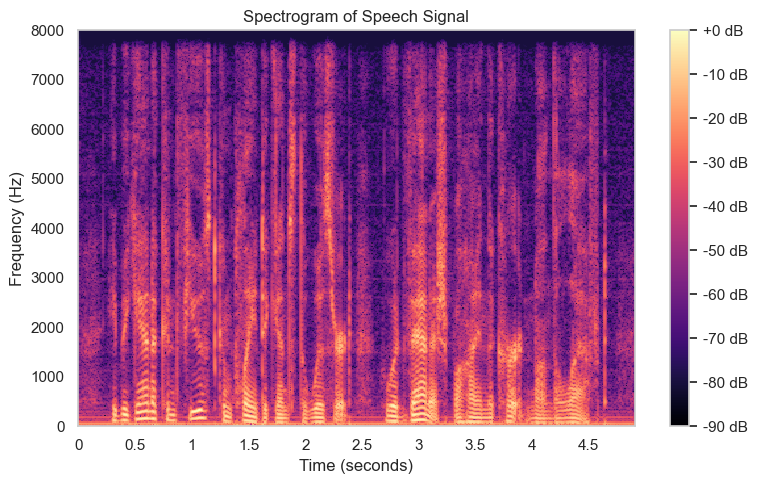

In [7]:

hop_length = 256
def compute_stft_magnitude(signal, n_fft=1024, hop_length=256, window='hann'):

    # Compute the STFT
    # TODO: code me
    stft = librosa.stft(signal, n_fft=n_fft, hop_length=hop_length, window=window)
    
    # Convert the magnitude to decibels
    # TODO: code me
    magnitude = np.abs(stft)

    magnitude_in_db = librosa.amplitude_to_db(magnitude, ref=np.max)

    return magnitude_in_db

# Compute the STFT magnitude
# TODO: code me
magnitude_in_db = compute_stft_magnitude(speech)

# Plot the Spectrogram with the specified settings
plt.figure(figsize=(8, 5))
librosa.display.specshow(
    magnitude_in_db,
    sr=sr,
    hop_length=hop_length,
    x_axis='time',
    y_axis='linear',  # Linear frequency scale
    cmap='magma'
)
plt.colorbar(format='%+2.0f dB')
plt.clim(-90, 0)  # Amplitude range in dB
plt.title('Spectrogram of Speech Signal')
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency (Hz)')
plt.ylim(0, 8000)  # Frequency range
plt.tight_layout()
plt.show()

# Male and Female Speech

**Split Male and Female Speech**
* Ensure the original speech files are located under `data/LibriSpeech/`. 
* Create two folders, `data/male/` and `data/female/`, to store male and female speech files.
* Parse `data/LibriSpeech/SPEAKERS.TXT` to create a mapping of speaker IDs to their gender (male or female). The file contains speaker metadata, including gender information, that can be parsed programmatically.
* Traverse the `data/LibriSpeech/` directory to locate `.flac` files.
* For each file, check its speaker ID, and save it in `.wav` format in the appropriate folder (`male/` or `female/`).

In [8]:
male_dir = "data/male/"
female_dir = "data/female/"

if not os.path.exists(male_dir):
    os.makedirs(male_dir)

if not os.path.exists(female_dir):
    os.makedirs(female_dir)

# Load the speakers metadata
speakers_metadata_path = "data/SPEAKERS.TXT"

# Read the metadata file
speakers_metadata = pd.read_csv(speakers_metadata_path, skiprows=11, delimiter="|")
speakers_metadata.head(5)


,;ID,SEX,SUBSET,MINUTES,NAME
0,14,F,train-clean-360,25.03,Kristin LeMoine
1,16,F,train-clean-360,25.11,Alys AtteWater
2,17,M,train-clean-360,25.04,Gord Mackenzie
3,19,F,train-clean-100,25.19,Kara Shallenberg
4,20,F,train-other-500,30.07,Gesine


In [9]:
speakers_metadata.columns = speakers_metadata.columns.str.strip()
print(speakers_metadata.columns)

Index([';ID', 'SEX', 'SUBSET', 'MINUTES', 'NAME'], dtype='object')


In [10]:
clean_data_dir = "data/test-clean/"

# https://docs.python.org/3/library/glob.html - glob module finds all the pathnames matching a specified pattern
# list all the folders in the clean data directory
speaker_ids = os.listdir(clean_data_dir)

for speaker_id in speaker_ids:
    # Find the speaker metadata
    speaker_metadata = speakers_metadata[speakers_metadata[";ID"] == int(speaker_id)]
    # # Find .flac files in nested directories
    speaker_files = []

    for root, dirs, files in os.walk(os.path.join(clean_data_dir, speaker_id)):
        for file in files:
            if file.endswith(".flac"):
                speaker_files.append(os.path.join(root, file))

    for file in speaker_files:
        # Load the audio file
        speech, sr = librosa.load(file)

        # Check if the speaker
        if speaker_metadata['SEX'].values[0].strip() == 'F':
            # Save the audio file
            file_name = file.split("/")[-1]
            save_path = female_dir + file_name.replace(".flac", ".wav")

            # Export the audio file
            sf.write(save_path, speech, sr)
        elif speaker_metadata["SEX"].values[0].strip() == 'M':
            # Save the audio file
            file_name = file.split("/")[-1]
            save_path = male_dir + file_name.replace(".flac", ".wav")
            # Export the audio file
            sf.write(save_path, speech, sr)




**Male and Female Spectra**
* Spectum data
    * Load a male and female speech files.
    * Compute the spectrum for the male speech signal using `compute_spectrum()` and store the resulting frequencies and magnitudes in `male_frequencies` and `male_magnitudes`.
    * Compute the spectrum for the female speech signal using `compute_spectrum()` and store the resulting frequencies and magnitudes in `female_frequencies` and `female_magnitudes`.
* Plot
    * Create a plot figure with a size of 12x6 using `plt.figure()`.
    * Plot the male speech spectrum with frequencies on the x-axis, magnitudes on the y-axis, and format it with a blue line and transparency (`alpha=0.7`).
    * Plot the female speech spectrum on the same plot, formatted with a red line and transparency (`alpha=0.7`).
    * Set the x-axis to a logarithmic scale using `plt.xscale('log')` for better visualization of frequency ranges.
    * Set the y-axis to a logarithmic scale using `plt.yscale('log')` for better visualization of magnitude ranges.
    * Add a title, axis labels, and a grid to the plot using `plt.title()`, `plt.xlabel()`, `plt.ylabel()`, and `plt.grid()`.
    * Add a legend to distinguish between male and female spectra using `plt.legend()`.
    * Adjust the layout of the plot for better fit using `plt.tight_layout()`.
    * Display the plot using `plt.show()`.

In [11]:
# Plot Male Spectra
# TODO: code me
# Compute spectra
# TODO: code me
male_frequencies = []
male_magnitudes = []
male_speech_files = librosa.util.find_files(male_dir, ext='wav')
male_speech_files = np.asarray(male_speech_files)

for y in male_speech_files:
    data = librosa.load(y)
    positive_frequencies, positive_magnitudes = compute_spectrum(data[0])
    male_frequencies.append(positive_frequencies)
    male_magnitudes.append(positive_magnitudes)


print("male_frequencies", male_frequencies[:2])
print("male_magnitudes", male_magnitudes[:2])

male_frequencies [array([9.58312327e-02, 1.91662465e-01, 2.87493698e-01, ...,
       1.10247125e+04, 1.10248083e+04, 1.10249042e+04]), array([3.05342454e-01, 6.10684909e-01, 9.16027363e-01, ...,
       1.10240840e+04, 1.10243893e+04, 1.10246947e+04])]
male_magnitudes [array([0.43496705, 0.16055011, 0.28878417, ..., 0.0014861 , 0.00310159,
       0.00654193]), array([0.24810616, 0.32170836, 0.26006266, ..., 0.0019876 , 0.0019358 ,
       0.00163353])]


In [12]:
# Plot Female Spectra
# TODO: code me
# Compute spectra
# TODO: code me
female_frequencies = []
female_magnitudes = []

female_speech_files = librosa.util.find_files(female_dir, ext='wav')
female_speech_files = np.asarray(female_speech_files)

for y in female_speech_files:
    data = librosa.load(y)
    positive_frequencies, positive_magnitudes = compute_spectrum(data[0])
    female_frequencies.append(positive_frequencies)
    female_magnitudes.append(positive_magnitudes)

print("female_frequencies", female_frequencies[:2])
print("female_magnitudes", female_magnitudes[:2])

female_frequencies [array([1.18203310e-01, 2.36406619e-01, 3.54609929e-01, ...,
       1.10247045e+04, 1.10248227e+04, 1.10249409e+04]), array([1.68775402e-01, 3.37550805e-01, 5.06326207e-01, ...,
       1.10245781e+04, 1.10247468e+04, 1.10249156e+04])]
female_magnitudes [array([0.37524424, 0.35416693, 0.24771335, ..., 0.00134708, 0.00423024,
       0.00508057]), array([0.23576028, 0.3203121 , 0.75858038, ..., 0.00138585, 0.00267143,
       0.00606053])]


In [13]:
male_random_index = np.random.randint(0, len(male_frequencies))

print("male_random_index", male_random_index)

female_random_index = np.random.randint(0, len(female_frequencies))

print("female_random_index", female_random_index)

male_random_index 121
female_random_index 872


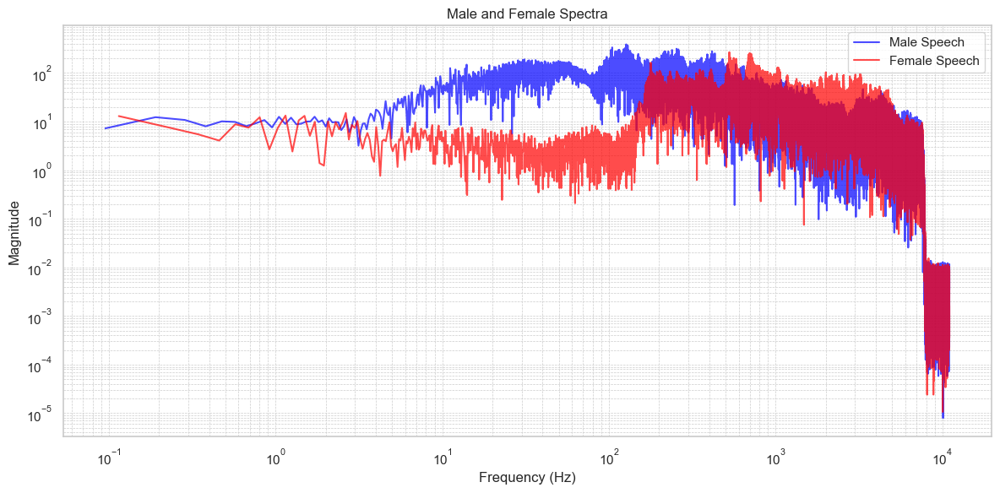

In [14]:
# Plot the spectra
plt.figure(figsize=(12, 6))
plt.plot(male_frequencies[male_random_index], male_magnitudes[male_random_index], label='Male Speech', color='blue', alpha=0.7)
plt.plot(female_frequencies[female_random_index], female_magnitudes[female_random_index], label='Female Speech', color='red', alpha=0.7)

# Add plot details
plt.xscale('log')  # Logarithmic scale for frequency
plt.yscale('log')  # Logarithmic scale for magnitude
plt.title('Male and Female Spectra')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.grid(which='both', linestyle='--', linewidth=0.5)
plt.legend()
plt.tight_layout()
plt.show()

# Noise

**White Noise (WN)**

A random signal with a flat spectral density, meaning it contains equal power across all frequencies, often resembling a "hissing" sound.

* Define a function generate_white_noise with parameters duration (in seconds) and sampling_rate (in Hz).
* Calculate the total number of samples as $duration \times sampling\_rate$.
* Generate a 1D array of random values from a normal distribution with a mean of 0 and a standard deviation of 1, creating a total of num_samples values.
* Return the generated array as the white noise signal.

In [15]:
def generate_white_noise(duration, sr):
    """
    Generate white noise.
    """
    # Calculate the total number of samples
    # TODO: code me
    total_samples = duration * sr
    
    # Generate white noise with a normal distribution (mean=0, std=1)
    # TODO: code me
    white_noise = np.random.normal(0, 1, total_samples)
    
    return white_noise

Generate and Display a white noise signal, but pay attention to your ear(s).

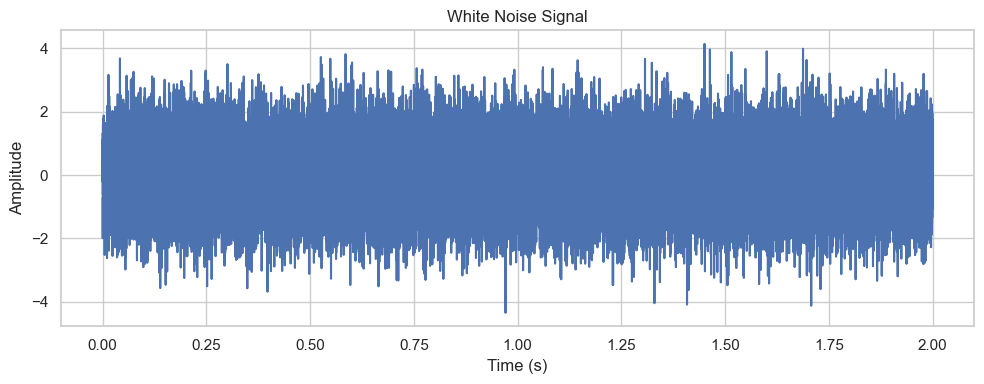

In [16]:
# TODO: code me
duration = 2  # seconds
sr = 22050  # sample rate

white_noise = generate_white_noise(duration, sr)

# Plot the white noise
plt.figure(figsize=(10, 4))
sns.lineplot(x=np.linspace(0, duration, len(white_noise)), y=white_noise)
plt.title("White Noise Signal")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()


Save the white noise in `data/noise/` folder using `soundfile`.

In [17]:
# Display the white noise signal
Audio(white_noise, rate=sr)

In [18]:
# TODO: code me
# Save the white noise signal as a WAV file
white_noise_path = "data/noise/"
if not os.path.exists(white_noise_path):
    os.makedirs(white_noise_path)

# Export the white noise signal
sf.write(white_noise_path + "white_noise.wav", white_noise, sr)

**Speech-Shaped Noise (SSN)**

A type of noise generated by matching the spectral envelope of a speech signal while randomizing its phase, making it sound like unintelligible speech.

* Define a function `generate_ssn` that takes a 1D NumPy array x (speech signal) as input and returns a 1D array (speech-shaped noise).
* Compute the Fourier transform of the input signal x using `np.fft.rfft()`.
* Generate a random phase using $$e^{2j \pi \cdot r}$$ where $r$ is a random value in [0,1].
* Multiply the magnitude of the Fourier transform by the random phase to create a randomized spectrum.
* Perform an inverse Fourier transform using `np.fft.irfft()` to reconstruct the noise in the time domain.
* Return the real part of the inverse Fourier transform as the generated speech-shaped noise.

In [19]:
# TODO: code me
def generate_ssn(input):
  fft_signal = np.fft.rfft(input)
  random_phase = np.exp(2j * np.pi * np.random.rand(len(fft_signal)))
  magnitude = np.abs(fft_signal)
  randomized_spectrum = magnitude * random_phase
  ssn = np.fft.irfft(randomized_spectrum)

  return ssn.real

Load a (male/female) speech signal, Generate then Listen to the speech-shaped noise.

In [20]:
# TODO: code me
male_speech, sr = librosa.load(male_dir + "61-70968-0000.wav")

# Generate Speech Shaped Noise
# input = white_noise * male_speech
ssn = generate_ssn(male_speech)
print(ssn)

[ 0.01044936  0.02540455  0.03537474 ... -0.00627294 -0.00592456
  0.00034131]


Save the speech-shaped noise in `data/noise/` folder.

In [21]:
# TODO: code me
sf.write(white_noise_path + "ssn.wav", ssn, sr)

**Babble Noise (BN)**

Background noise of overlapping sound of multiple people talking, commonly occurring in real-world environments like busy cafes or crowds.

* Download a babble noise (e.g., crowd sounds) from [freesound](freesound.org) and save it in the `data/noise/` folder.
* Load and display the chosen babble noise. 

In [22]:
# TODO: code me
busy_cafe_sound, sr = librosa.load("data/noise/busy-cafe-2.wav")

# Display the busy cafe sound
Audio(busy_cafe_sound, rate=sr)

**Noise Spectra**

Using the `compute_spectrum` function, plot the spectra of white noise, speech-shaped noise, and babble noise, superimposing all three spectra on a single plot for comparison.

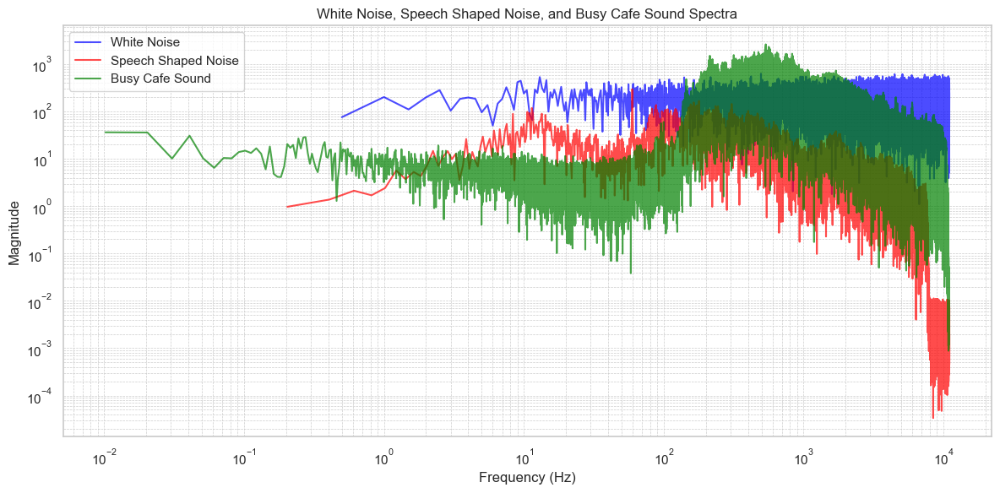

In [23]:
# TODO: code me  
white_noise_positive_frequencies, white_noise_positive_magnitudes = compute_spectrum(white_noise)

speech_shaped_noise_positive_frequencies, speech_shaped_noise_positive_magnitudes = compute_spectrum(ssn)

busy_cafe_positive_frequencies, busy_cafe_positive_magnitudes = compute_spectrum(busy_cafe_sound)

# Plot the spectra
plt.figure(figsize=(12, 6))
plt.plot(white_noise_positive_frequencies, white_noise_positive_magnitudes, label='White Noise', color='blue', alpha=0.7)
plt.plot(speech_shaped_noise_positive_frequencies, speech_shaped_noise_positive_magnitudes, label='Speech Shaped Noise', color='red', alpha=0.7)
plt.plot(busy_cafe_positive_frequencies, busy_cafe_positive_magnitudes, label='Busy Cafe Sound', color='green', alpha=0.7)

# Add plot details
plt.xscale('log')  # Logarithmic scale for frequency
plt.yscale('log')  # Logarithmic scale for magnitude
plt.title('White Noise, Speech Shaped Noise, and Busy Cafe Sound Spectra')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.grid(which='both', linestyle='--', linewidth=0.5)
plt.legend()
plt.tight_layout()
plt.show()

**Noise Spectrograms**

Using the `compute_stft_magnitude` function, create a plot with three subplots arranged in a single row, showcasing the spectrograms of white noise, speech-shaped noise, and babble noise.

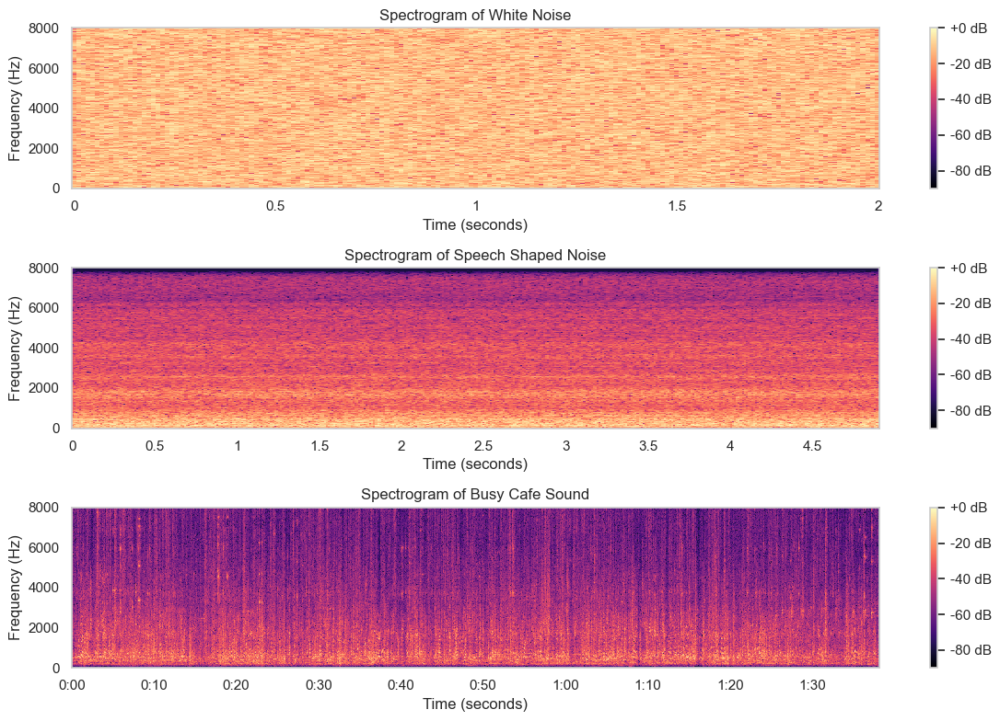

In [24]:
# TODO: code me
white_noise_magnitude_in_db = compute_stft_magnitude(white_noise)

speech_shaped_noise_magnitude_in_db = compute_stft_magnitude(ssn)

busy_cafe_magnitude_in_db = compute_stft_magnitude(busy_cafe_sound)

# Plot the Spectrogram with the specified settings
plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
librosa.display.specshow(
    white_noise_magnitude_in_db,
    sr=sr,
    hop_length=hop_length,
    x_axis='time',
    y_axis='linear',  # Linear frequency scale
    cmap='magma'
)
plt.colorbar(format='%+2.0f dB')
plt.clim(-90, 0)  # Amplitude range in dB
plt.title('Spectrogram of White Noise')
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency (Hz)')
plt.ylim(0, 8000)  # Frequency range

plt.subplot(3, 1, 2)
librosa.display.specshow(
    speech_shaped_noise_magnitude_in_db,
    sr=sr,
    hop_length=hop_length,
    x_axis='time',
    y_axis='linear',  # Linear frequency scale
    cmap='magma'
)
plt.colorbar(format='%+2.0f dB')
plt.clim(-90, 0)  # Amplitude range in dB
plt.title('Spectrogram of Speech Shaped Noise')
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency (Hz)')
plt.ylim(0, 8000)  # Frequency range

plt.subplot(3, 1, 3)
librosa.display.specshow(
    busy_cafe_magnitude_in_db,
    sr=sr,
    hop_length=hop_length,
    x_axis='time',
    y_axis='linear',  # Linear frequency scale
    cmap='magma'
)
plt.colorbar(format='%+2.0f dB')
plt.clim(-90, 0)  # Amplitude range in dB
plt.title('Spectrogram of Busy Cafe Sound')
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency (Hz)')
plt.ylim(0, 8000)  # Frequency range

plt.tight_layout()
plt.show()

**Spectra of Male Speech, Female Speech, and Noise**

Copy your code from **Male and Female Spectra**, and add a noise of your choice.

In [25]:
# TODO: code me
# Load the speech signal
male_speech, sr = librosa.load("data/male/61-70968-0000.wav")

# Add busy_cafe_sound to the speech signal
speech_with_noise = male_speech + busy_cafe_sound[:len(male_speech)]

# Display the noisy speech signal
Audio(speech_with_noise, rate=sr)

# Creating Mixtures

**Normalization**

$$x_{\text{norm}}(n) = \frac{x(n)}{\max(|x(n)|)}$$

Where:

* $x(n)$: Original speech signal.
* $x_{\text{norm}}(n)$: Normalized speech signal.
* $\max\left(|x(n)|\right)$: The maximum absolute value of the signal $x(n)$.

This ensures the signal amplitude is scaled between $-1$ and $1$.

* Load `data/female/121-121726-0000.wav` and normalize it.
* Normalize the speech-shaped noise signal. 

In [26]:
# TODO: code me
female_speech, sr = librosa.load("data/female/121-121726-0000.wav")

Audio(female_speech, rate=sr)

In [27]:
# Normalize the female speech signal
female_speech_normalized = female_speech / np.max(np.abs(female_speech))

# Display the normalized speech signal
Audio(female_speech_normalized, rate=sr)

**Create Mixture**

Generating a mixture is the process of combining a clean speech signal $s$ with a noise signal $n$, scaled by a factor $\alpha$, to produce a resulting mixture signal $m$.

$$m = s + \alpha \cdot n$$

Let's create our first mixture.
* Generate a mixture using the formula, setting $\alpha$ to `1`. 
* Play the resulting mixture to hear the combined effect.

In [28]:
# TODO: code me
mixture_one = female_speech + 1 * busy_cafe_sound[:len(female_speech)]

# Display the noisy speech signal
Audio(mixture_one, rate=sr)

Generate and Play the mixture with $\alpha$ set to `2`. 

In [29]:
# TODO: code me
mixture_two = female_speech + 2 * busy_cafe_sound[:len(female_speech)]

# Display the noisy speech signal
Audio(mixture_two, rate=sr)

Generate and Play the mixture with $\alpha$ set to `0.5`. 

In [30]:
# TODO: code me
mixture_point_five = female_speech + 0.5 * busy_cafe_sound[:len(female_speech)]

# Display the noisy speech signal
Audio(mixture_point_five, rate=sr)

**Power**

Power refers to the average energy of a signal over time. For a discrete-time signal, power is calculated as the mean of the squared amplitudes of the signal. It represents the strength or intensity of the signal.

$$P = \frac{1}{N} \sum_{n=1}^{N} x^2(n)$$

* Compute and print the power of the speech.
* Compute and print the power of the noise.

In [31]:
# TODO: code me

female_speech_power = np.sum(np.square(female_speech))

print("Power of female speech", female_speech_power)

Power of female speech 485.03067


In [32]:
busy_cafe_sound_power = np.sum(np.square(busy_cafe_sound))

print("Power of busy cafe sound", busy_cafe_sound_power)

Power of busy cafe sound 22881.182


**Signal-to-Noise Ration (SNR)**

The SNR is a measure that compares the power of a signal (speech or desired audio) to the power of noise present in the same signal. It is expressed in decibels (dB) and is given by:

$$\text{SNR (dB)} = 10 \cdot \log_{10}\left(\frac{P_s}{P_n}\right)$$

- Positive SNR (e.g., SNR = 1):
  - The signal power is greater than the noise power.
  - The speech is relatively clear compared to the noise.

- Zero SNR (SNR = 0):
  - The signal power is equal to the noise power.
  - Both speech and noise are equally loud, making it challenging to separate them.

- Negative SNR (e.g., SNR = -1):
  - The noise power is greater than the signal power.
  - The speech is buried under the noise and becomes difficult to discern.

Compute and print the SNR between the chosen speech and noise.

In [33]:
# TODO: code me
signal_noise_ratio = 10 * np.log(female_speech_power / busy_cafe_sound_power)

print("Signal to Noise Ratio (SNR) in dB", signal_noise_ratio)

Signal to Noise Ratio (SNR) in dB -38.5385799407959


**Compute the Gain**

The parameter $\alpha$ corresponds to the gain, which controls the relative level of the noise $n$ in the mixture.

To create a mixture where the speech and noise are at the same level (SNR=0), we need to determine the appropriate gain $\alpha$ to scale the noise correctly. This gain is calculated using the following formula : 

$$\alpha = \sqrt{\frac{\text{P}_{s}}{\text{P}_{n} \cdot 10^{\frac{\text{SNR}}{10}}}}$$

Compute the gain to achieve the desired SNR of 0 (independent of the previously computed SNR).

In [34]:
# TODO: code me
gain = np.sqrt(female_speech_power / busy_cafe_sound_power * (10 ** (signal_noise_ratio / 10)))

print("Gain", gain)

Gain 0.0017227266607170494


**Scale the noise**

Scale the noise signal using the gain calculated in the previous step.

In [35]:
# TODO: code me
scaled_noise = gain * busy_cafe_sound[:len(female_speech)]

Audio(scaled_noise, rate=sr)

**Create the mixture**

In [36]:
# TODO: code me
mixture = female_speech + scaled_noise

Audio(mixture, rate=sr)